In [1]:
# Import packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d
from pathlib import Path
import pandas as pd
import h5py
import re
import os 
import json 

# File paths
folderpath = Path(r'F:\AlterG\Control\Data')
HeelPathTemplate = r'F:\AlterG\Control\Data\{}\Gait\DevicesData.mat'
header_line = 8
pattern = r"\\([^\\]+)_ik"
base_json_path = r"F:\AlterG\Control\InverseKinematics"

# Dictionaries
concatenated_stride_data = {}
all_strides_dict = {'Right': {}, 'Left': {}}

#Function to interpolate strides to a common length and concatenate them
def interpolate_strides(strides, target_length=100):
    interpolated_values_list = []
    x_new = np.linspace(0, 1, target_length)
    
    for stride_array in strides:
        for stride in stride_array:
            if len(stride) < 1:
                continue
            
            x_old = np.linspace(0, 1, len(stride))
            
            if len(stride) < 4:
                interp_func = interp1d(x_old, stride, kind='linear', bounds_error=False, fill_value="extrapolate")
            else:
                interp_func = interp1d(x_old, stride, kind='cubic', bounds_error=False, fill_value="extrapolate")
            
            interpolated_values = interp_func(x_new)
            interpolated_values_list.append(interpolated_values)
    
    return np.array(interpolated_values_list)

# Function to plot all strides per header in a single plot
def plot_stride_list(strideList, side, header):
    """    
    Parameters:
    strideList (list): List containing the stride data.
    side (str): Side of the stride ('Right' or 'Left').
    header (str): The header to plot.

    """
    plt.figure(figsize=(12, 6))
    for stride in strideList:
        plt.plot(stride, label=f'{side} Side', alpha=0.6)
    
    plt.title(f'All Strides for {header} ({side} Side)')
    plt.xlabel('Sample Points')
    plt.ylabel('Values')
    #plt.legend()
    plt.show()
    plt.close()

# Function to plot all interpolated strides per header in a single plot.
def plot_interpolated_values(interpolated_values, side, header):
    """
    Parameters:
    interpolated_values (ndarray): Array containing the interpolated stride data.
    side (str): Side of the stride ('Right' or 'Left').
    header (str): The header to plot.

    """
    plt.figure(figsize=(12, 6))
    for stride in interpolated_values:
        plt.plot(stride, alpha=0.6, label=f'{side} Side' if side not in plt.gca().get_legend_handles_labels()[1] else "")
    
    plt.title(f'Interpolated Strides for {header} ({side} Side)')
    plt.xlabel('Sample Points')
    plt.ylabel('Values')
    #plt.legend()
    plt.show()

# Function to plot concatenated strides for each header and side
def plot_subject(concatenated_stride_data, side, header):
    plt.figure(figsize=(12, 6))
    for stride_list in concatenated_stride_data[header][side]:
        for stride in stride_list:
            plt.plot(stride, alpha=0.6, label=f'{side} Side' if side not in plt.gca().get_legend_handles_labels()[1] else "")
    
    plt.title(f'Individual Strides for {header} ({side} Side) for {trial}')
    plt.xlabel('% Gait Cycle')
    plt.ylabel(f'{header} (deg)')
    #plt.legend()
    plt.show()
    plt.close()

# Function to plot mean and standard deviation for each header and side
def plot_mean_std(concatenated_stride_data):
    mean_strides_dict = {}
    std_strides_dict = {}

    for side in ['Right', 'Left']:
        mean_strides_dict[side] = {}
        std_strides_dict[side] = {}

        for header in concatenated_stride_data:
            all_strides_array = np.concatenate(concatenated_stride_data[header][side])
            mean_strides_dict[side][header] = np.mean(all_strides_array, axis=0)
            std_strides_dict[side][header] = np.std(all_strides_array, axis=0)

    # Plot mean with standard deviation shaded region for each header and side
    plot_handles = []
    for side in ['Right', 'Left']:
        for header in mean_strides_dict[side]:
            plt.figure(figsize=(12, 6))
            plot_handle, = plt.plot(mean_strides_dict[side][header], label=f'{side} Side')
            plt.fill_between(np.arange(len(mean_strides_dict[side][header])),
                             mean_strides_dict[side][header] - std_strides_dict[side][header],
                             mean_strides_dict[side][header] + std_strides_dict[side][header],
                             alpha=0.3)
            plt.title(f'{header} ({side} Side) for {trial}')
            plt.xlabel('% Gait Cycle')
            plt.ylabel(f'{header} (deg)')
            #plt.legend()
            plot_handles.append(plot_handle)
            plt.show()
            plt.close()

    return plot_handles

# Calculate length of each stride and then their mean and standard deviation
def clean_strides_mean_std(stride_list):
    lengths = [len(stride) for stride in stride_list]
    mean_length = np.mean(lengths)
    std_length = np.std(lengths)
    
    # Calculate the minimum acceptable length
    min_length = mean_length - std_length
    # Filter out strides that are shorter than the minimum acceptable length
    cleaned_strides = [stride for stride in stride_list if len(stride) >= min_length]
    
    return cleaned_strides

# Calculate the interquartile range
def clean_strides_iqr(stride_list):
    lengths = [len(stride) for stride in stride_list]
    
    # Calculate the first quartile (Q1) and third quartile (Q3)
    Q1 = np.percentile(lengths, 25)
    Q3 = np.percentile(lengths, 75)
    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1
    
    # Calculate the lower bound for acceptable lengths
    lower_bound = Q1 - 1.5 * IQR
    # Filter out strides that are shorter than the lower bound
    cleaned_strides = [stride for stride in stride_list if len(stride) >= lower_bound]
    
    return cleaned_strides

# Save the data to json files
def save_data_to_json(data, filepath):
    json_data = {header: {'Right': [arr.tolist() for arr in data[header]['Right']],
                          'Left': [arr.tolist() for arr in data[header]['Left']]}
                 for header in data}

    with open(filepath, 'w') as file:
        json.dump(json_data, file)
        
# Function to detect if the stride data is upside down and flip it
def correct_orientation(data_array):
    if np.mean(data_array) < 0:  # Assuming that correct data has positive mean
        return -data_array
    return data_array

# Function to process each side's strides and correct the orientation if necessary
def process_side_strides(heels, header, data):
    strideList = []
    for idx in range(len(heels) - 1):
        start_index = int(heels[idx][0]) if hasattr(heels[idx], '__iter__') else int(heels[idx])
        end_index = int(heels[idx + 1][0]) if hasattr(heels[idx + 1], '__iter__') else int(heels[idx + 1])
        
        # Ensure indices are valid
        if start_index < end_index:
            stride_data = data.iloc[start_index:end_index][header].values
            stride_data = correct_orientation(stride_data)  # Correct orientation if necessary
            strideList.append(stride_data)
            
    return strideList

    

In [2]:
# def segment_stride_phases(heel_indices, toe_indices, contralateral_heel_indices, contralateral_toe_indices, header, data, side, target_length=100):
#     phase_normalized_strides = []
#     phase_labels = []
#     num_strides = len(heel_indices) - 1

#     for idx in range(num_strides):
#         start_idx = int(heel_indices[idx])
#         end_idx = int(heel_indices[idx + 1])

#         if start_idx >= end_idx:
#             print(f"Invalid stride: start_idx ({start_idx}) >= end_idx ({end_idx})")
#             continue

#         stride_data = data.iloc[start_idx:end_idx][header].values
#         stride_length = len(stride_data)

#         if stride_length < 2:
#             print(f"Stride too short: {stride_length} points")
#             continue

#         # Find contralateral toe-off candidates
#         contralateral_toe_off_candidates = [toe for toe in contralateral_toe_indices if start_idx < toe < end_idx]
#         if not contralateral_toe_off_candidates:
#             print(f"No contralateral toe-off found within stride: {start_idx} to {end_idx}")
#             continue

#         contralateral_toe_off = int(min(contralateral_toe_off_candidates, key=lambda x: abs(x - start_idx)))

#         # Find contralateral heel contact candidates
#         contralateral_heel_candidates = [heel for heel in contralateral_heel_indices if start_idx < heel < end_idx]
#         if not contralateral_heel_candidates:
#             print(f"No contralateral heel contact found within stride: {start_idx} to {end_idx}")
#             continue

#         contralateral_heel_contact = int(min(contralateral_heel_candidates, key=lambda x: abs(x - contralateral_toe_off)))

#         ipsilateral_toe_off = int(min(toe_indices, key=lambda x: abs(x - start_idx)))
#         ipsilateral_heel_end = end_idx  # Toe-off is at the end of the stride

#         # Segment the phases
#         lr_segment = stride_data[0 : contralateral_toe_off - start_idx]
#         mtst_segment = stride_data[contralateral_toe_off - start_idx : contralateral_heel_contact - start_idx]
#         ps_segment = stride_data[contralateral_heel_contact - start_idx : ipsilateral_toe_off - start_idx]
#         end_segment = stride_data[ipsilateral_toe_off - start_idx : ipsilateral_heel_end - start_idx]

#         # Check for empty segments before interpolation
#         if len(lr_segment) == 0 or len(mtst_segment) == 0 or len(ps_segment) == 0 or len(end_segment) == 0:
#             print(f"Empty segment found in stride {idx}: skipping normalization")
#             continue

#         # Normalize each phase individually
#         lr_normalized = normalize_segment(lr_segment, 12)
#         mtst_normalized = normalize_segment(mtst_segment, 38)
#         ps_normalized = normalize_segment(ps_segment, 12)
#         end_normalized = normalize_segment(end_segment, 38)

#         final_normalized_stride = np.concatenate([lr_normalized, mtst_normalized, ps_normalized, end_normalized])

#         # Ensure the final length is 100 points
#         if len(final_normalized_stride) != target_length:
#             print(f"Normalized stride length mismatch: expected {target_length}, got {len(final_normalized_stride)}")
#             continue

#         phase_normalized_strides.append(final_normalized_stride)
#         phase_labels.append((12, 38, 12, 38))

#     return phase_normalized_strides, phase_labels

In [3]:
def segment_stride_phases(heel_indices, toe_indices, contralateral_heel_indices, contralateral_toe_indices, header, data, side, target_length=100):
    phase_normalized_strides = []
    phase_labels = []
    num_strides = len(heel_indices) - 1

    for idx in range(num_strides):
        start_idx = int(heel_indices[idx])
        end_idx = int(heel_indices[idx + 1])

        if start_idx >= end_idx:
            continue

        stride_data = data.iloc[start_idx:end_idx][header].values
        stride_length = len(stride_data)

        if stride_length < 2:
            continue

        # Find contralateral toe-off candidates
        contralateral_toe_off_candidates = [toe for toe in contralateral_toe_indices if start_idx < toe < end_idx]
        if not contralateral_toe_off_candidates:
            continue
        contralateral_toe_off = int(min(contralateral_toe_off_candidates, key=lambda x: abs(x - start_idx)))

        # Find contralateral heel contact candidates
        contralateral_heel_candidates = [heel for heel in contralateral_heel_indices if start_idx < heel < end_idx]
        if not contralateral_heel_candidates:
            continue
        contralateral_heel_contact = int(min(contralateral_heel_candidates, key=lambda x: abs(x - contralateral_toe_off)))
        
        # Find ipsilateral toe-off as the toe index closest to start_idx
        ipsilateral_toe_off_candidates = [toe for toe in toe_indices if start_idx < toe < end_idx]
        if not ipsilateral_toe_off_candidates:
            continue
        ipsilateral_toe_off = int(min(ipsilateral_toe_off_candidates, key=lambda x: abs(x - start_idx)))

        # Segment the phases
        lr_segment = stride_data[0 : contralateral_toe_off - start_idx]
        mtst_segment = stride_data[contralateral_toe_off - start_idx : contralateral_heel_contact - start_idx]
        ps_segment = stride_data[contralateral_heel_contact - start_idx : ipsilateral_toe_off - start_idx]

        # Check for empty segments before interpolation
        if len(lr_segment) == 0 or len(mtst_segment) == 0 or len(ps_segment) == 0:
            continue

        # Normalize each phase individually
        lr_normalized = normalize_segment(lr_segment, 12)
        mtst_normalized = normalize_segment(mtst_segment, 38)
        ps_normalized = normalize_segment(ps_segment, 12)

        # Find the ipsilateral heel contact of the next stride for the remaining segment
        if idx + 1 < num_strides:
            next_start_idx = int(heel_indices[idx + 1])
            remaining_segment = data.iloc[ipsilateral_toe_off:next_start_idx][header].values
        else:
            remaining_segment = []

        # Normalize remaining segment to 38 points
        if len(remaining_segment) > 0:
            remaining_normalized = normalize_segment(remaining_segment, 38)
            final_normalized_stride = np.concatenate([lr_normalized, mtst_normalized, ps_normalized, remaining_normalized])
        else:
            final_normalized_stride = np.concatenate([lr_normalized, mtst_normalized, ps_normalized])

        # Ensure the final length is 100 points
        if len(final_normalized_stride) < target_length:
            remaining_length = target_length - len(final_normalized_stride)
            final_normalized_stride = np.concatenate([final_normalized_stride, np.zeros(remaining_length)])
        elif len(final_normalized_stride) > target_length:
            final_normalized_stride = final_normalized_stride[:target_length]

        phase_normalized_strides.append(final_normalized_stride)
        phase_labels.append((12, 38, 12, len(remaining_segment)))

    return phase_normalized_strides, phase_labels

def normalize_segment(segment, target_length):
    if len(segment) < 1:
        return np.zeros(target_length)
    
    x_new = np.linspace(0, 1, target_length)
    x_old = np.linspace(0, 1, len(segment))
    
    if len(segment) < 4:
        interp_func = interp1d(x_old, segment, kind='linear', bounds_error=False, fill_value="extrapolate")
    else:
        interp_func = interp1d(x_old, segment, kind='cubic', bounds_error=False, fill_value="extrapolate")
    
    return interp_func(x_new)

In [4]:
def plot_normalized_strides(phase_normalized_strides_r, phase_normalized_strides_l, header, phase_labels_r, phase_labels_l):
    # Determine the min and max values across both Right and Left side strides
    min_r = min([min(stride) for stride in phase_normalized_strides_r])
    max_r = max([max(stride) for stride in phase_normalized_strides_r])
    min_l = min([min(stride) for stride in phase_normalized_strides_l])
    max_l = max([max(stride) for stride in phase_normalized_strides_l])

    # Determine the common min and max values for y-axis
    common_min = (min(min_r, min_l) - 2)
    common_max = (max(max_r, max_l) + 2)

    # Create the plot
    plt.figure(figsize=(12, 6))

    # Plot Right side
    plt.subplot(1, 2, 1)
    for stride in phase_normalized_strides_r:
        if len(stride) == 100:  # Ensure that the stride is fully normalized
            plt.plot(stride, alpha=0.7)
        else:
            print(f"Stride length for right side is not 100: {len(stride)}")
    plt.title(f'{header} - Right Side')
    plt.xlabel('Normalized Points')
    plt.ylabel(header)
    plt.axvline(x=12, color='r', linestyle='--', label='LR end')
    plt.axvline(x=50, color='r', linestyle='--', label='MTSt end')
    plt.axvline(x=62, color='r', linestyle='--', label='PS end')

    # Set the same y-axis limits for both subplots
    plt.ylim([common_min, common_max])

    # Plot Left side
    plt.subplot(1, 2, 2)
    for stride in phase_normalized_strides_l:
        if len(stride) == 100:  # Ensure that the stride is fully normalized
            plt.plot(stride, alpha=0.7)
        else:
            print(f"Stride length for left side is not 100: {len(stride)}")
    plt.title(f'{header} - Left Side')
    plt.xlabel('Normalized Points')
    plt.ylabel(header)
    plt.axvline(x=12, color='r', linestyle='--', label='LR end')
    plt.axvline(x=50, color='r', linestyle='--', label='MTSt end')
    plt.axvline(x=62, color='r', linestyle='--', label='PS end')

    # Set the same y-axis limits for both subplots
    plt.ylim([common_min, common_max])

    plt.tight_layout()
    plt.show()


C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
C:\Users\ashwi\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: Run

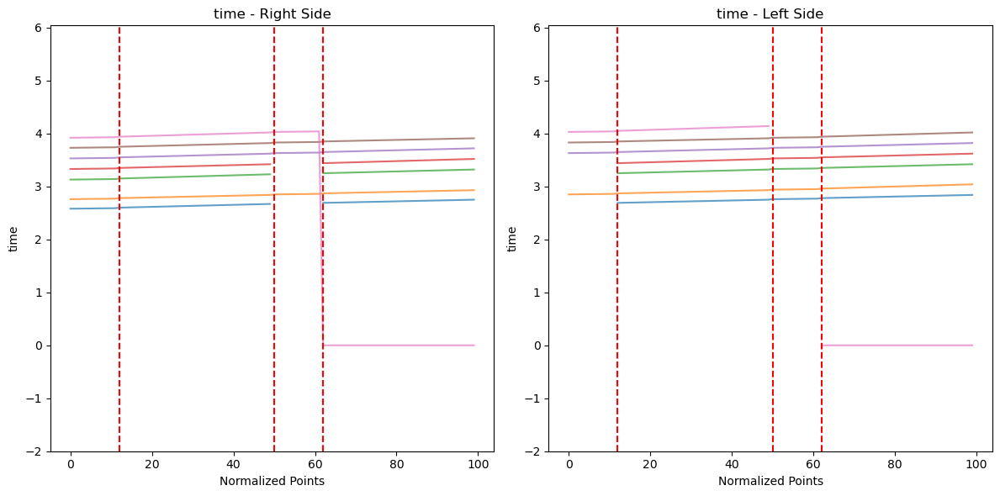

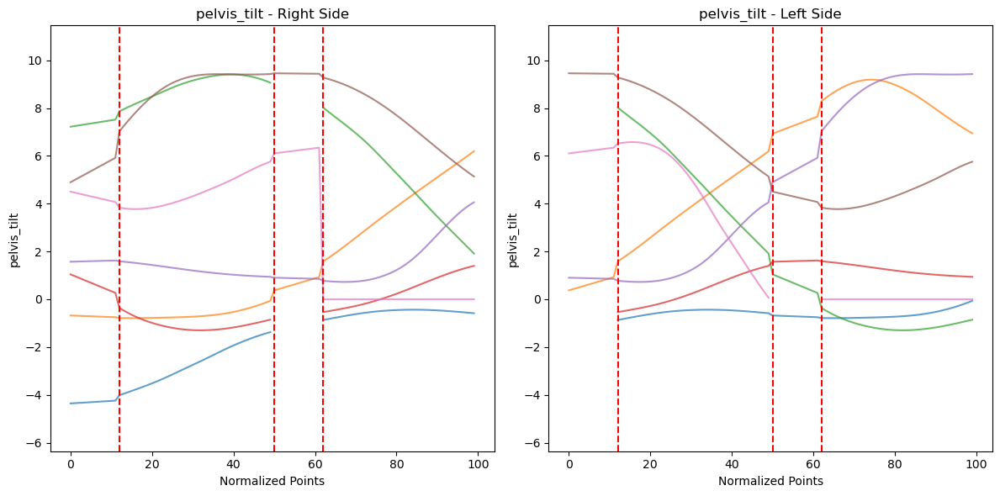

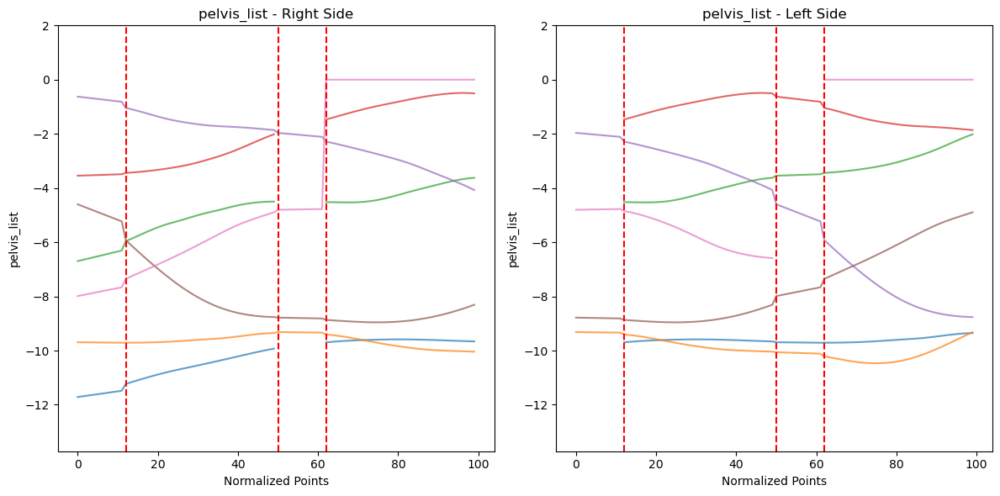

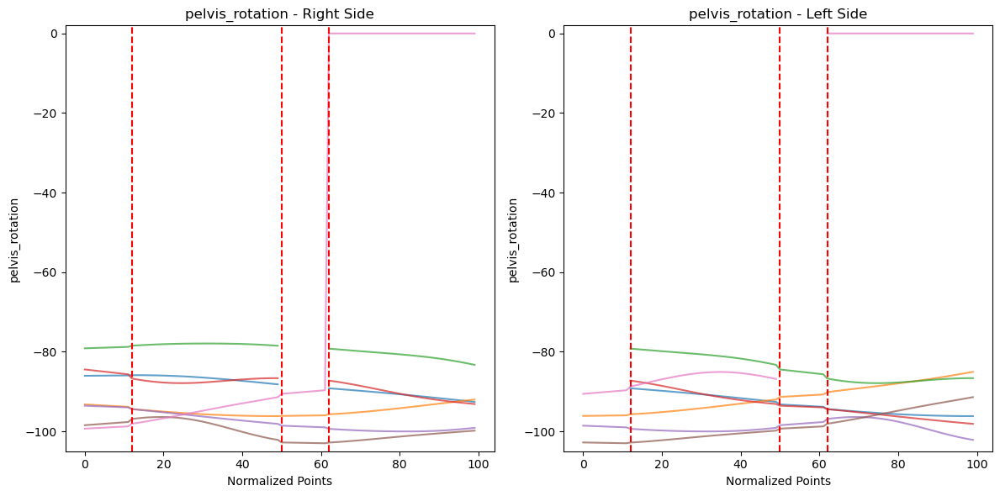

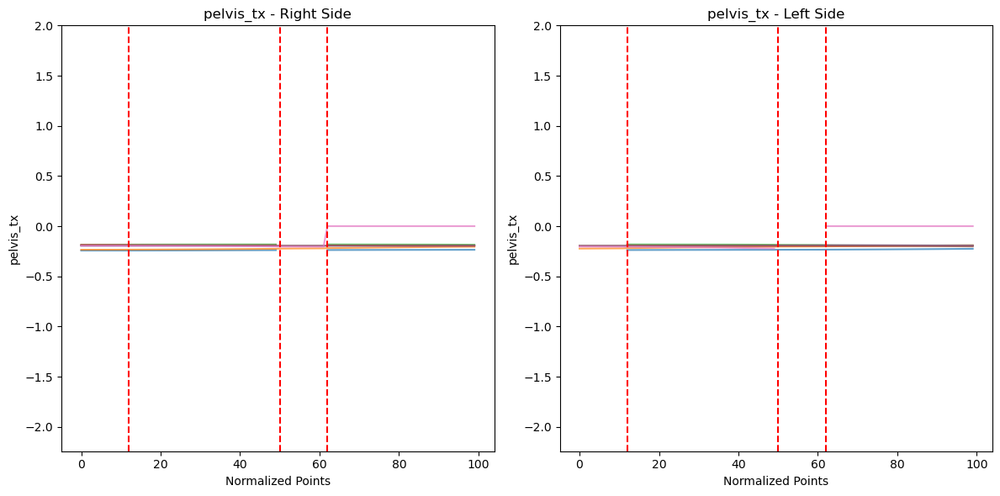

...

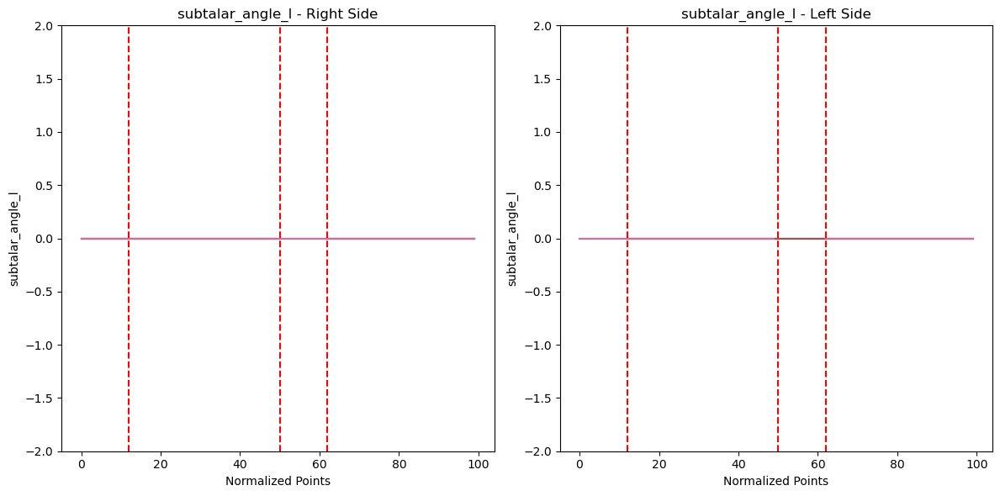

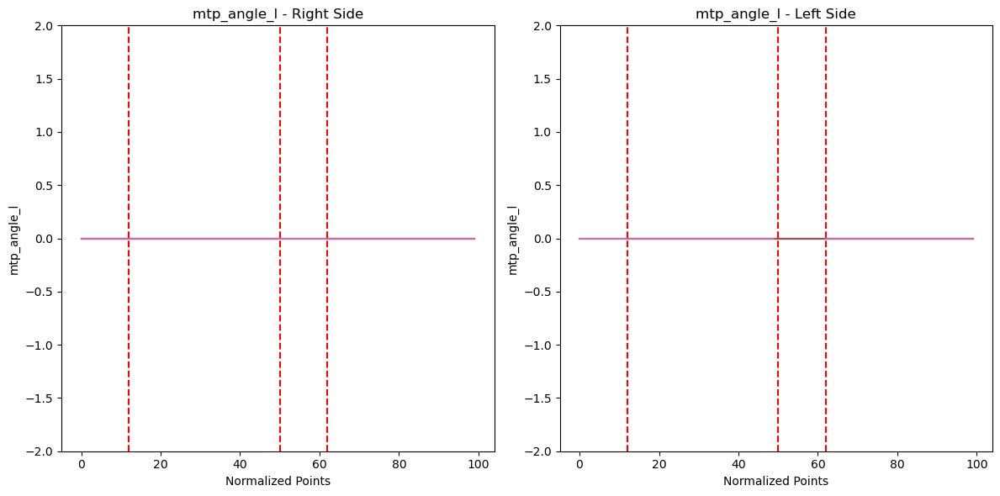

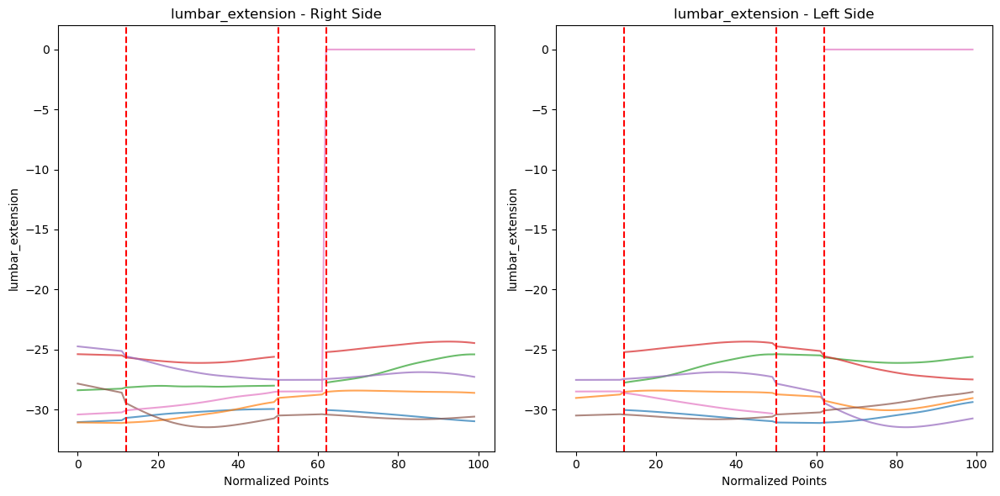

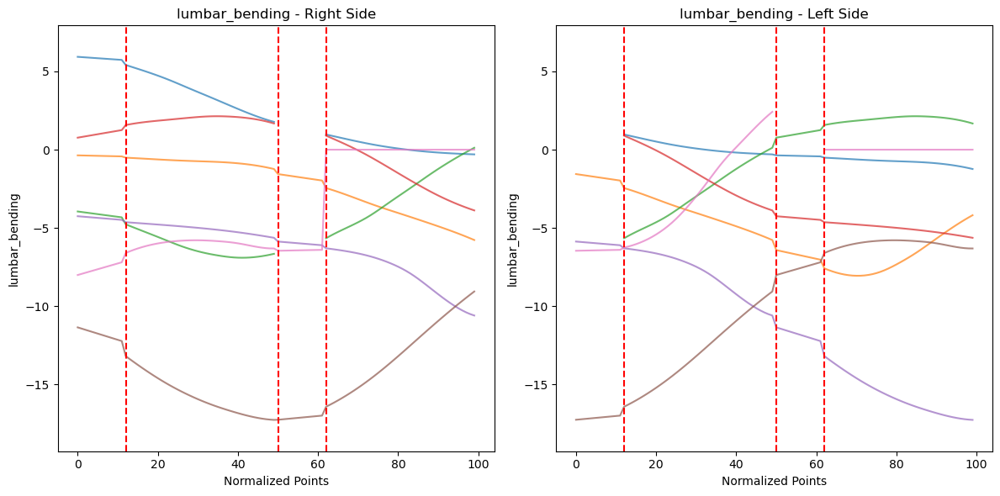

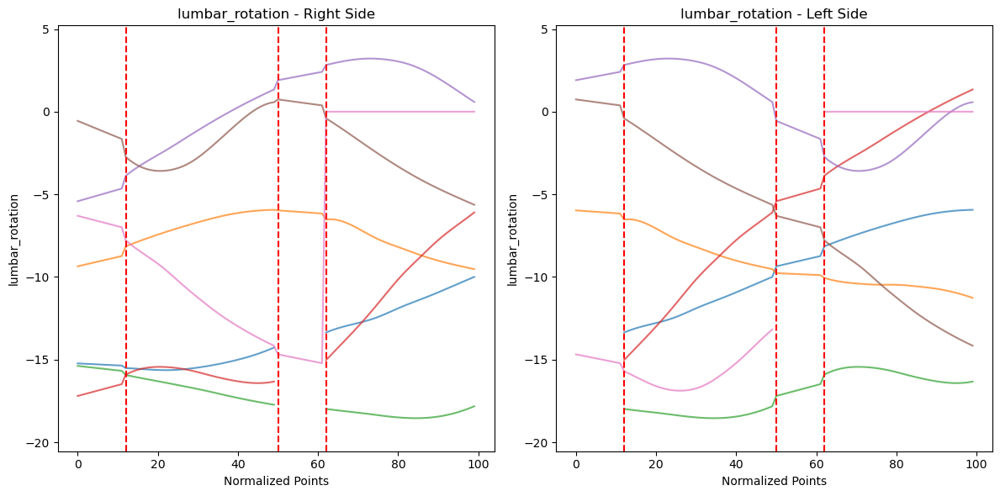

C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\a

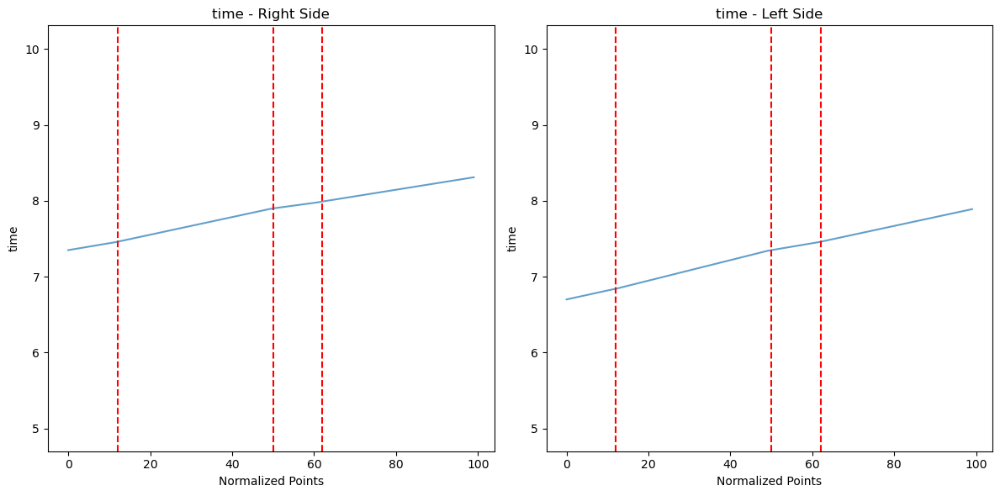

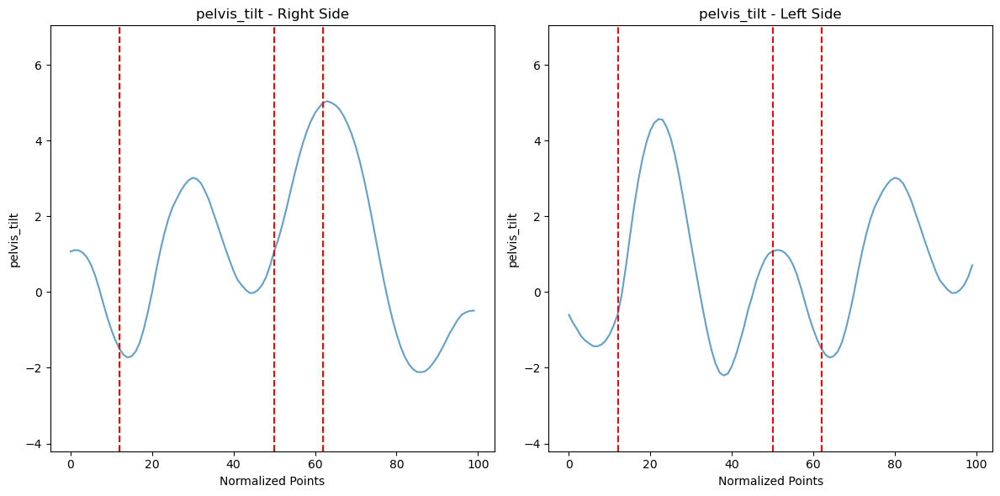

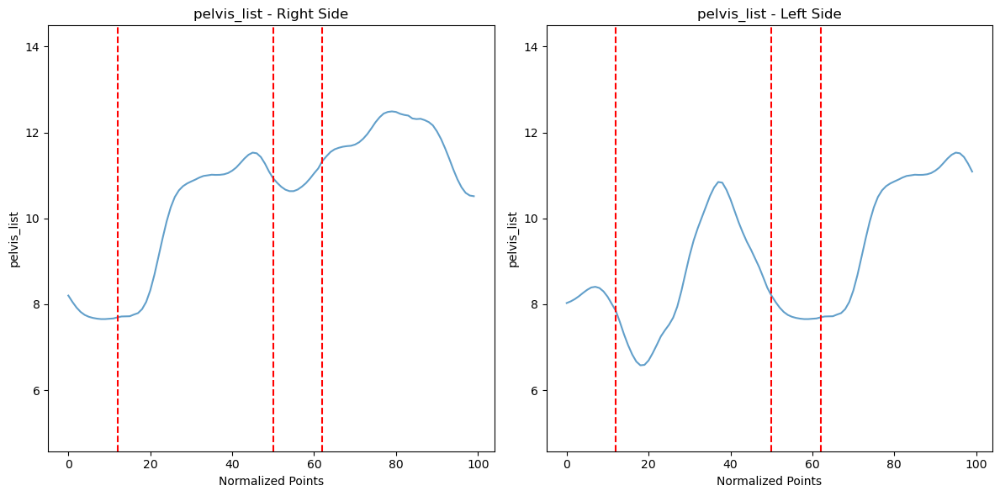

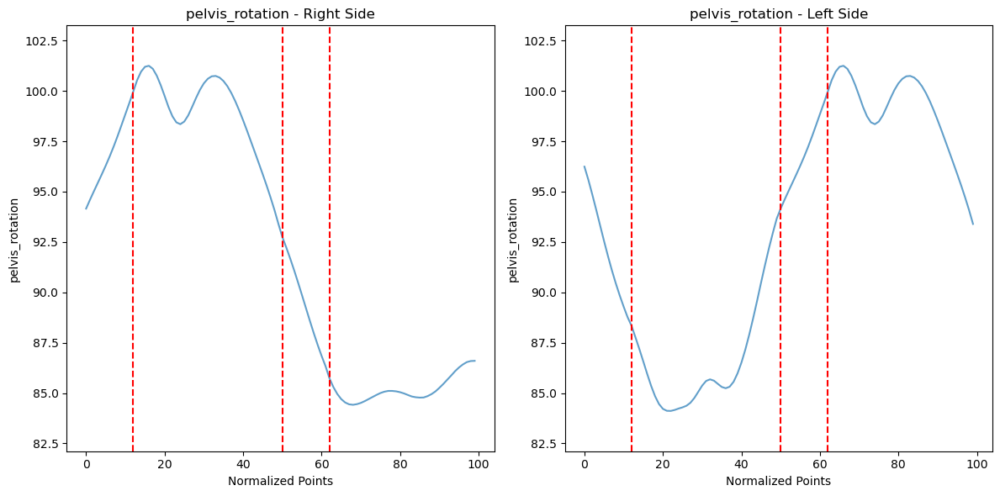

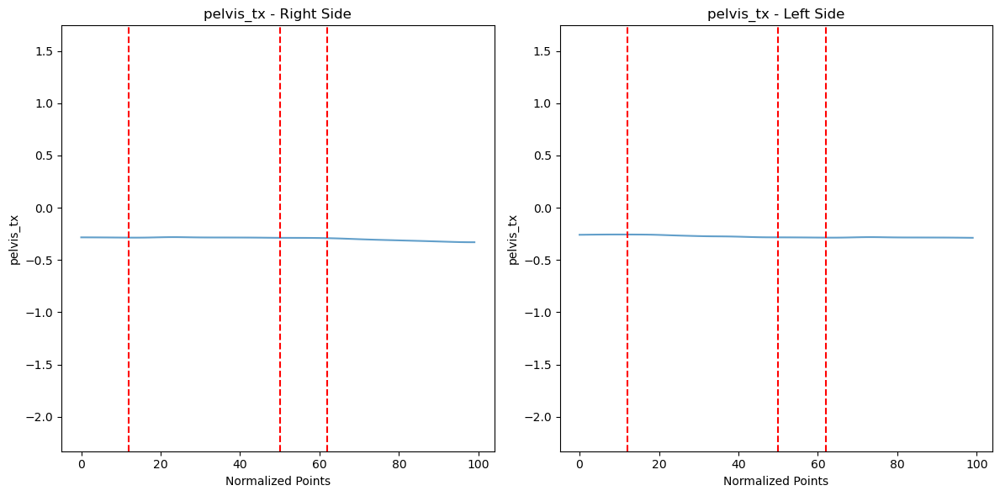

...

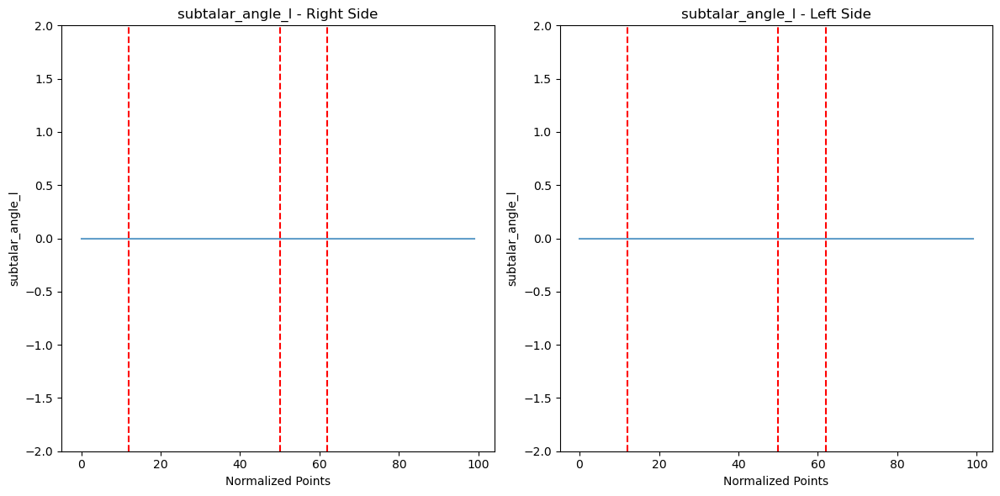

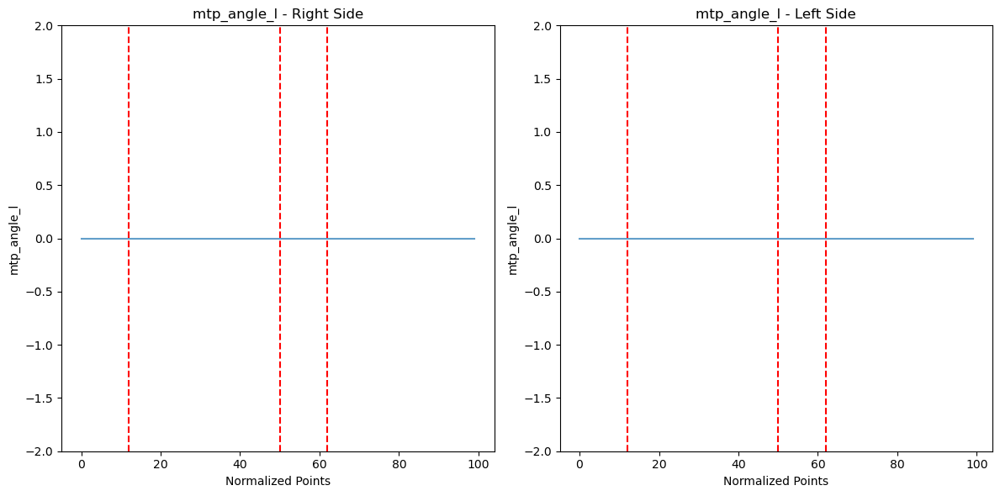

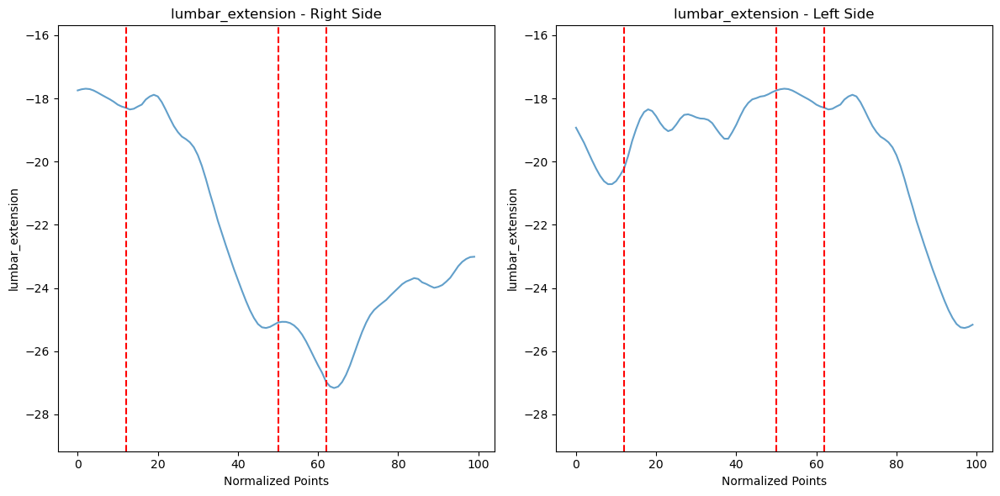

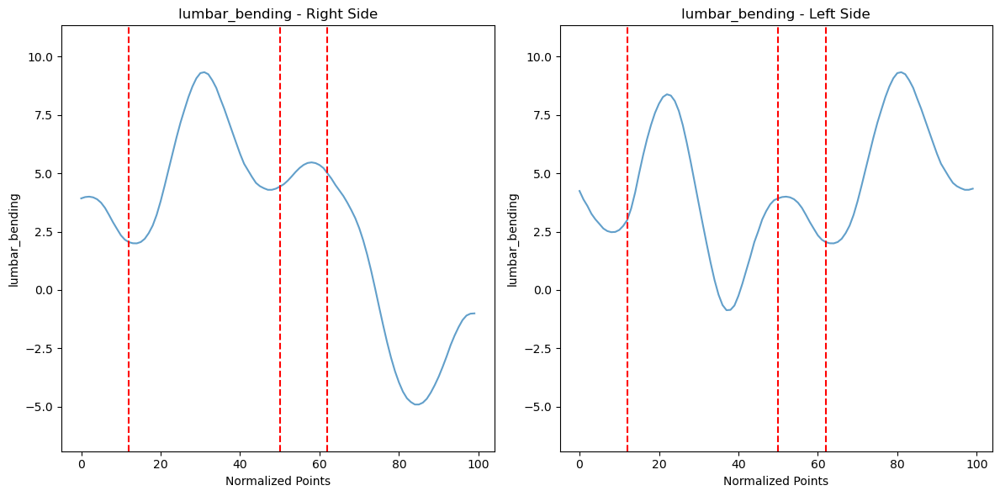

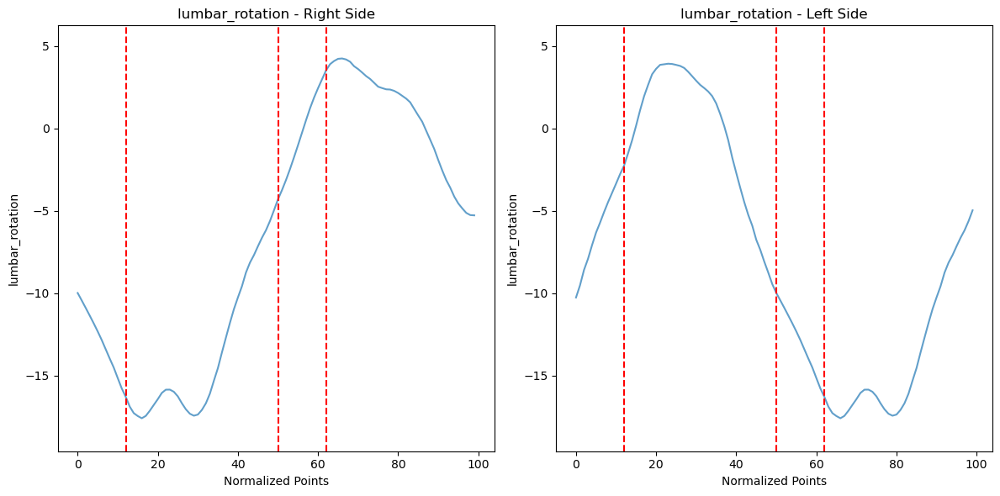

C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\a

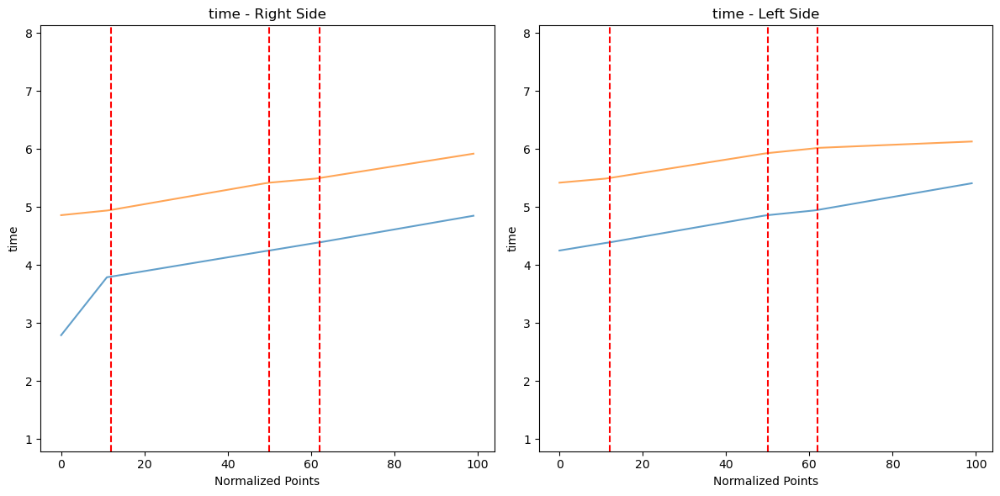

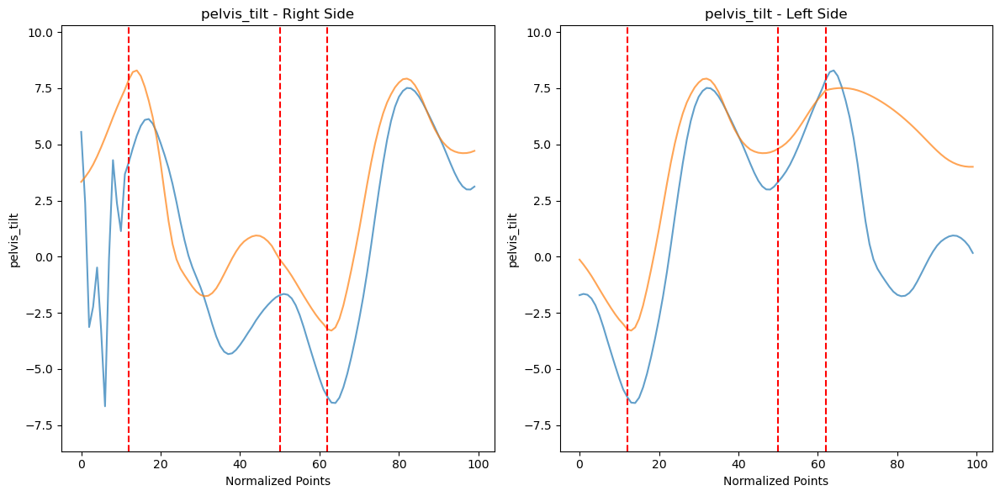

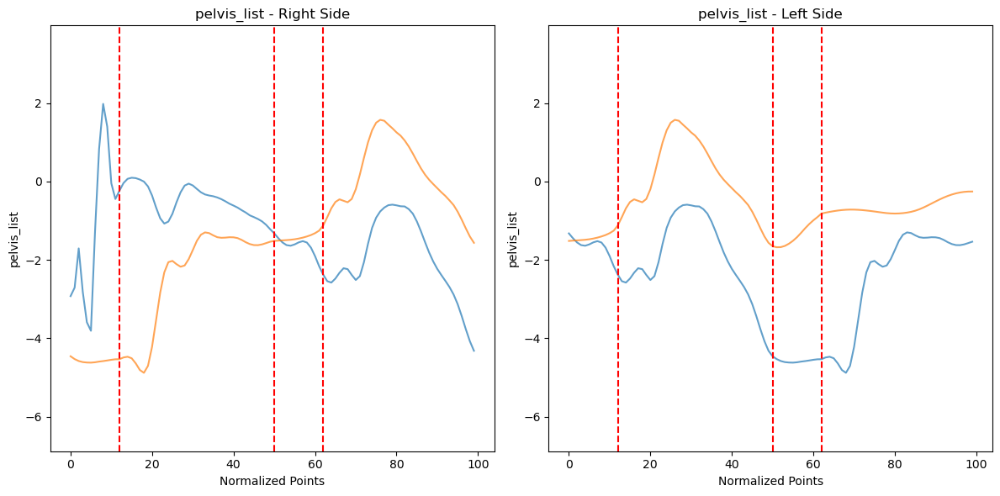

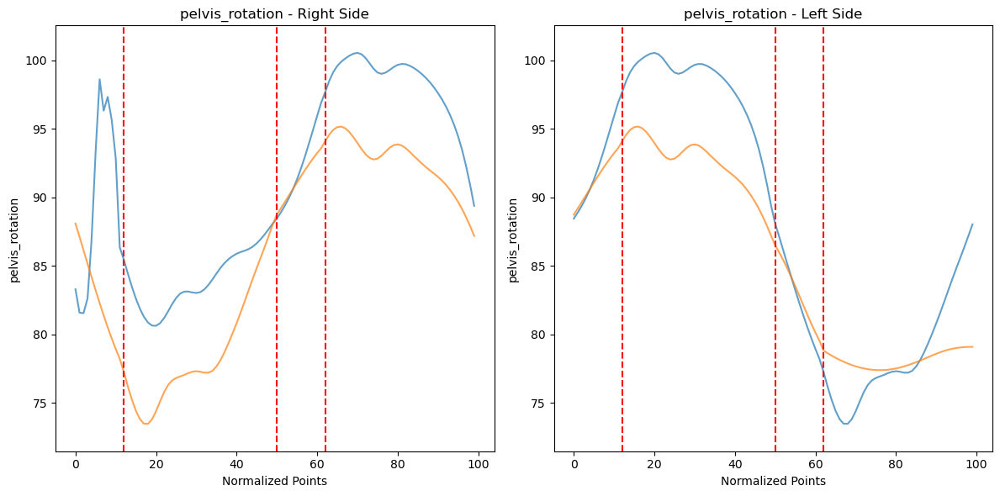

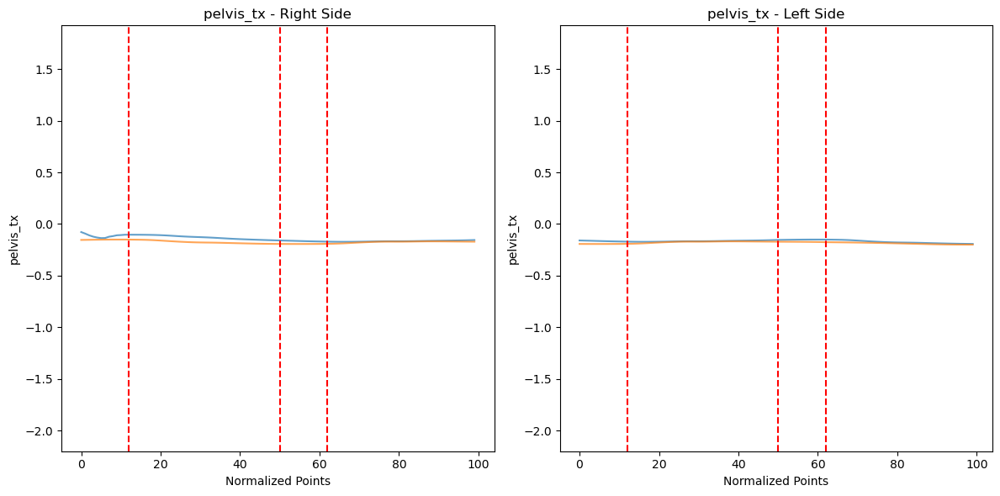

...

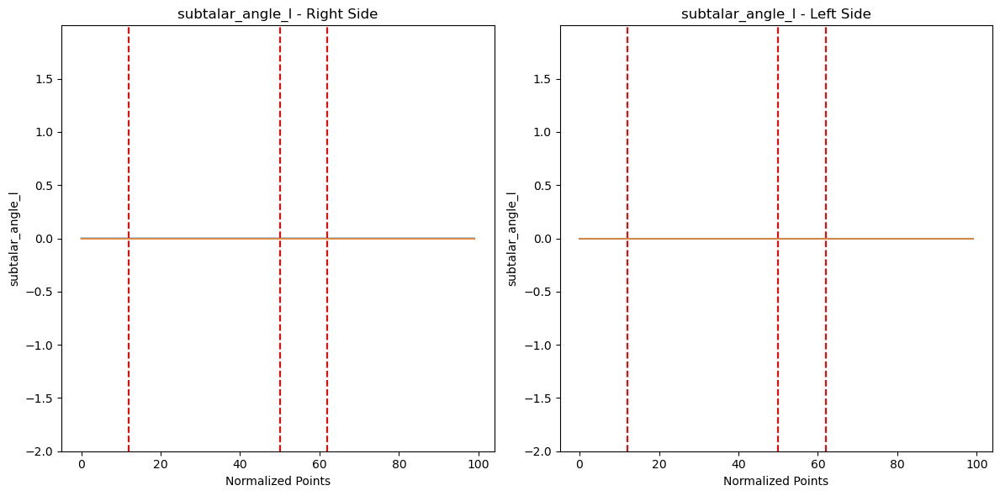

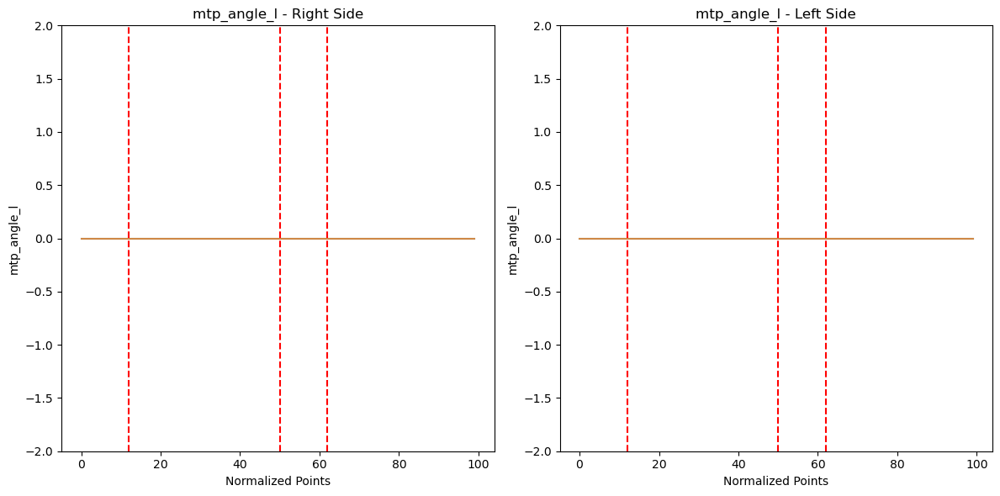

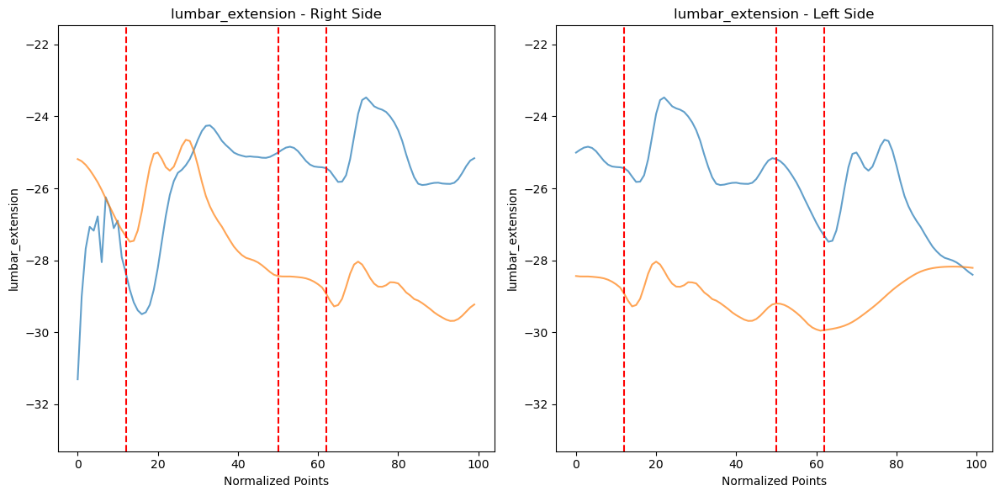

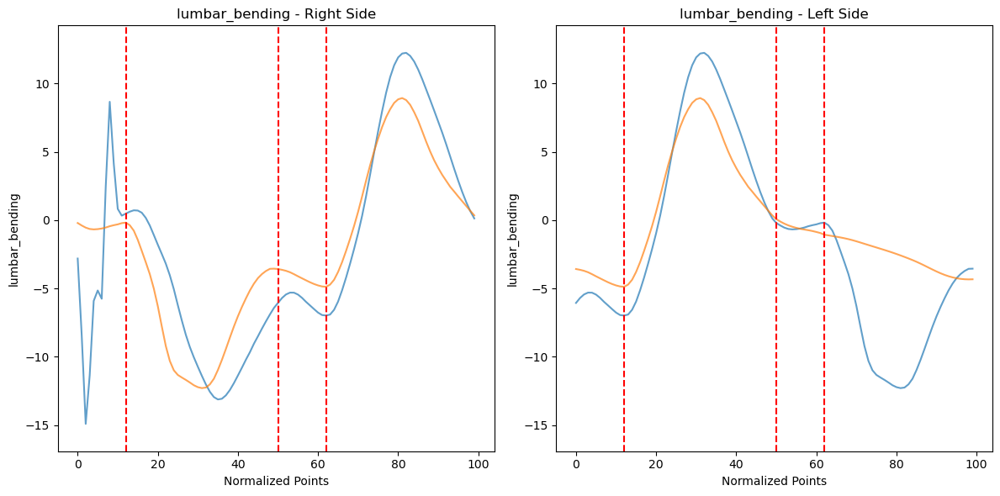

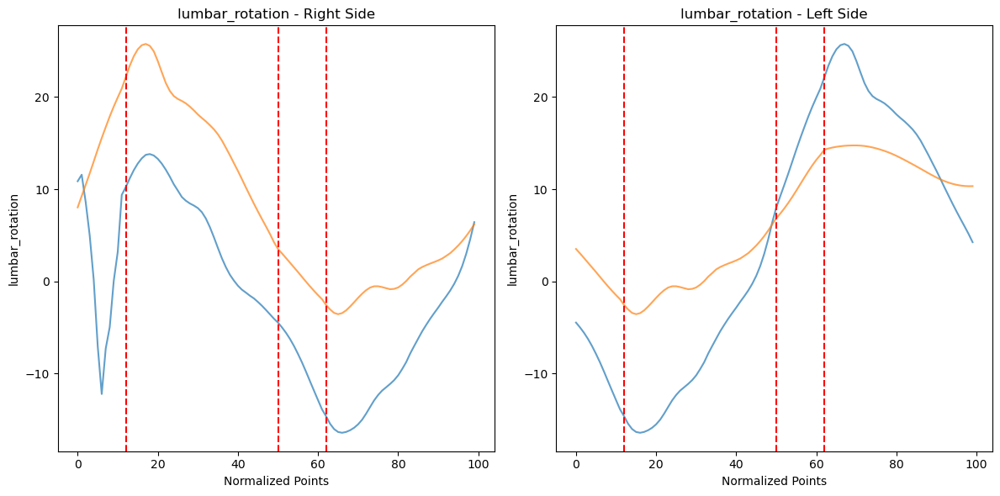

C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\a

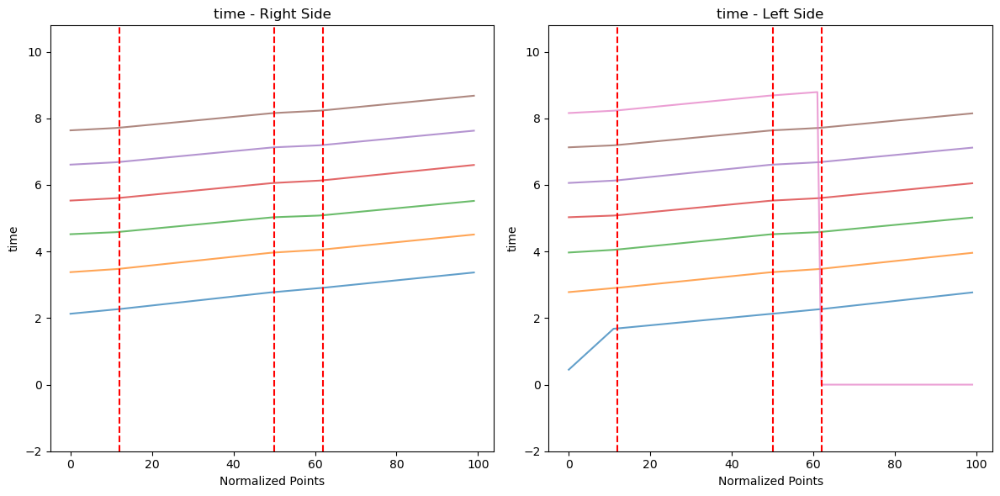

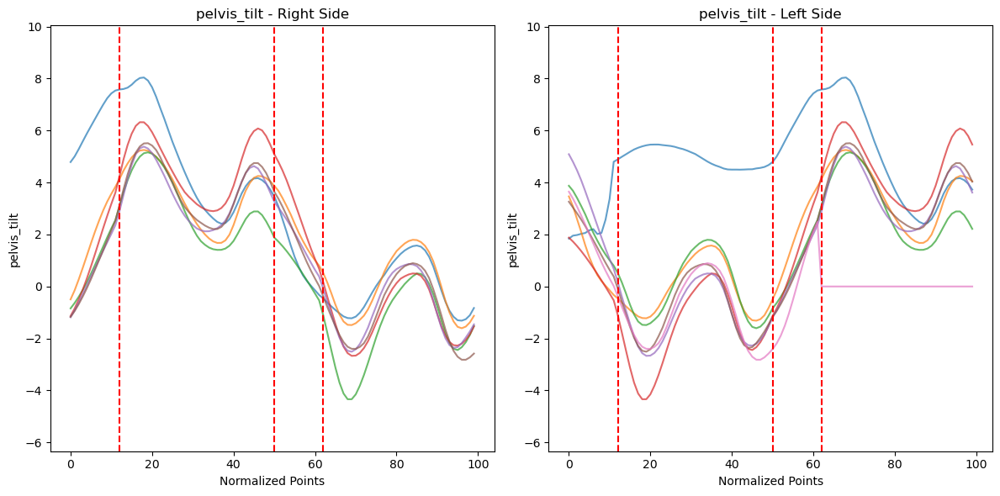

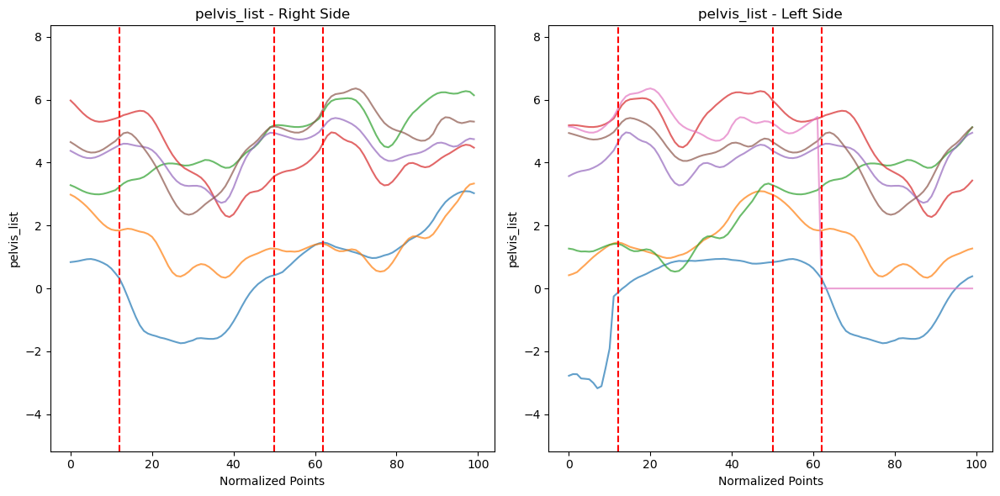

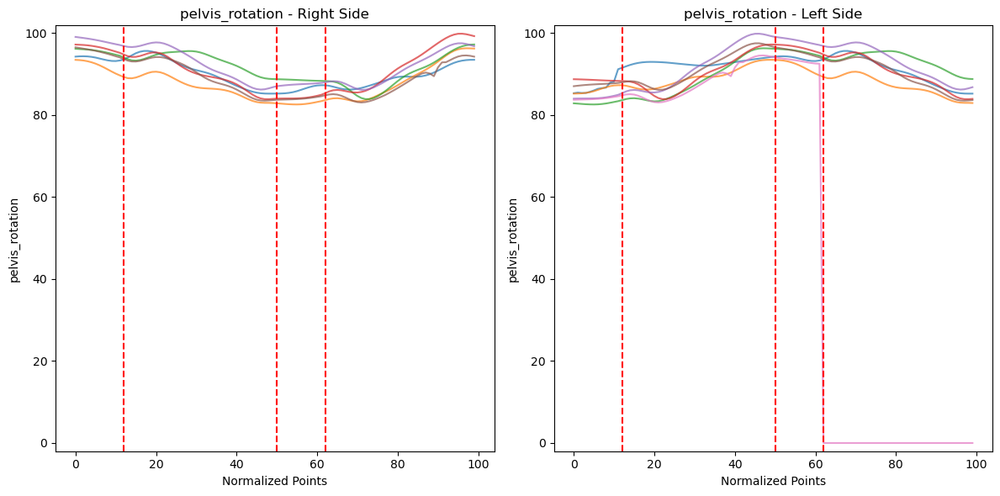

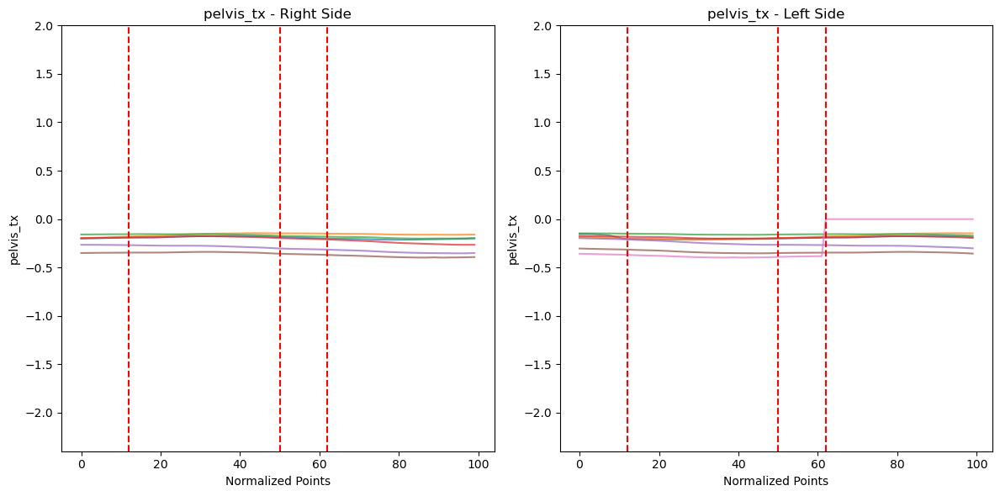

...

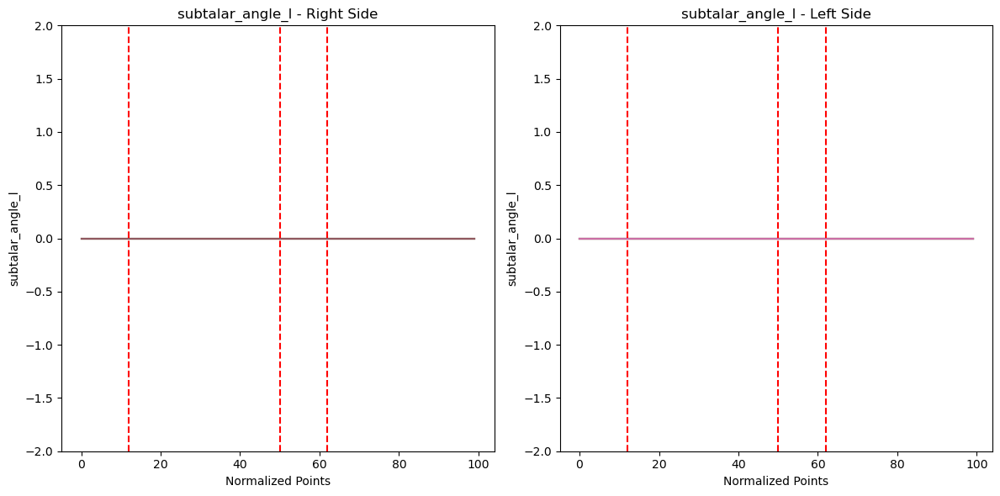

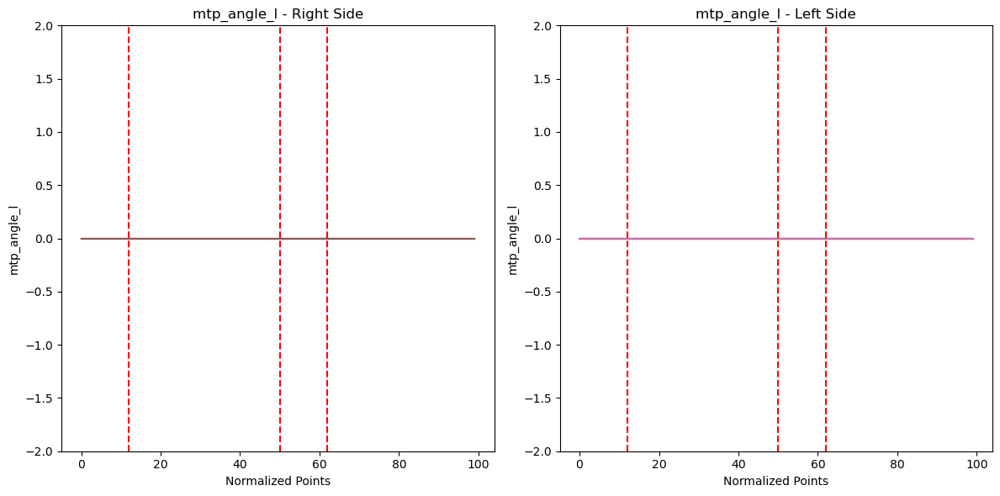

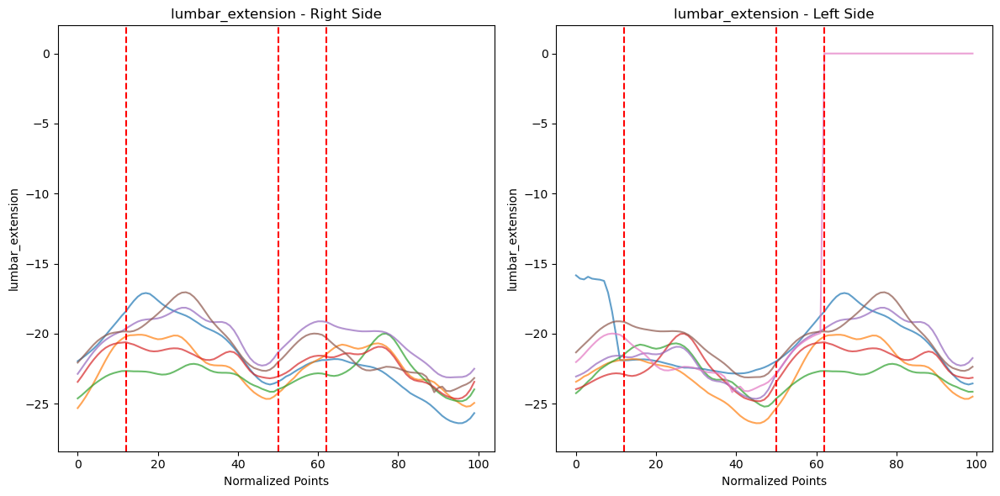

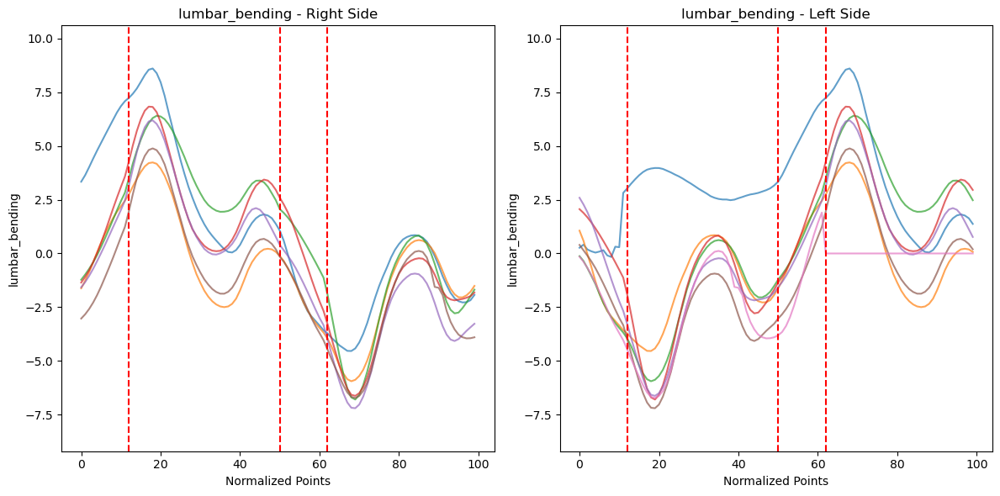

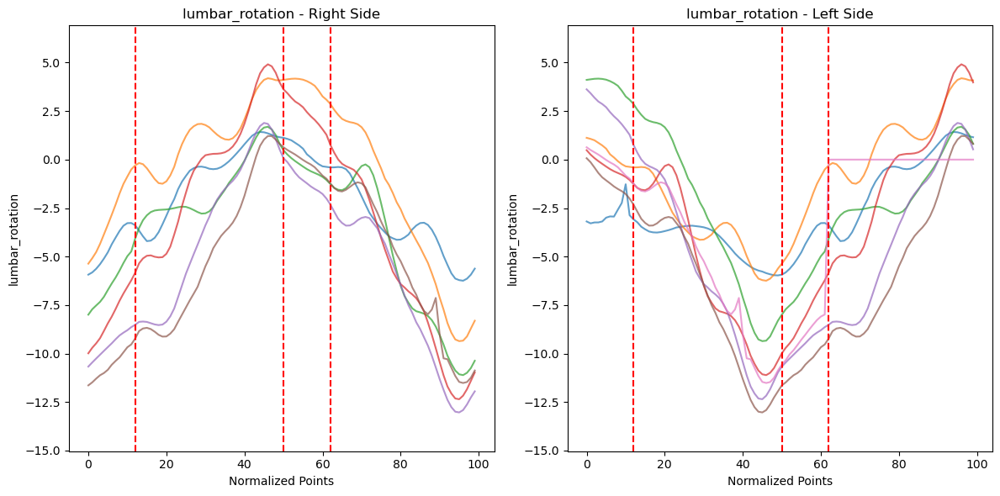

C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\ashwi\anaconda3\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\a

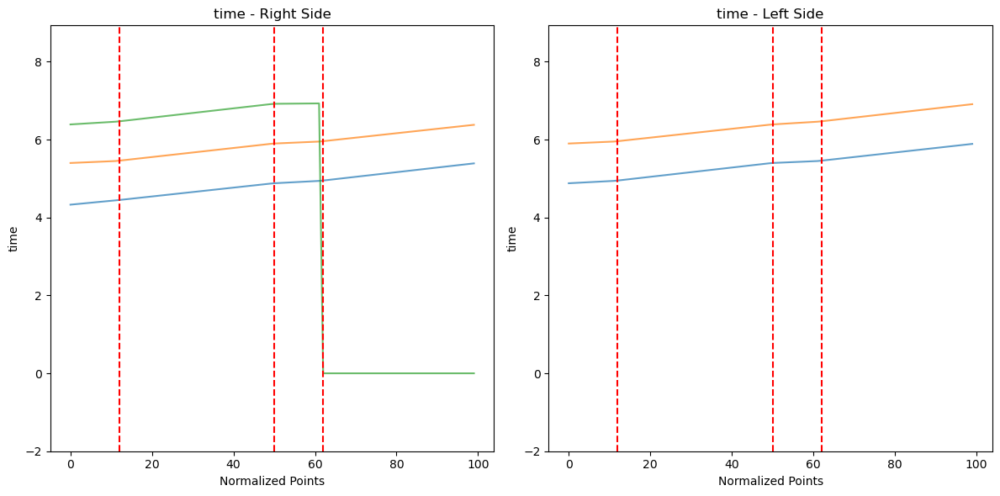

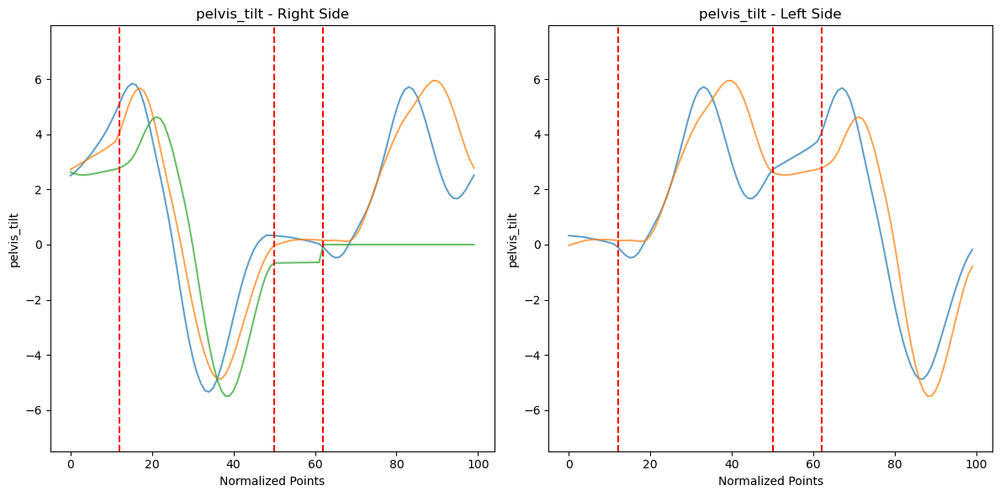

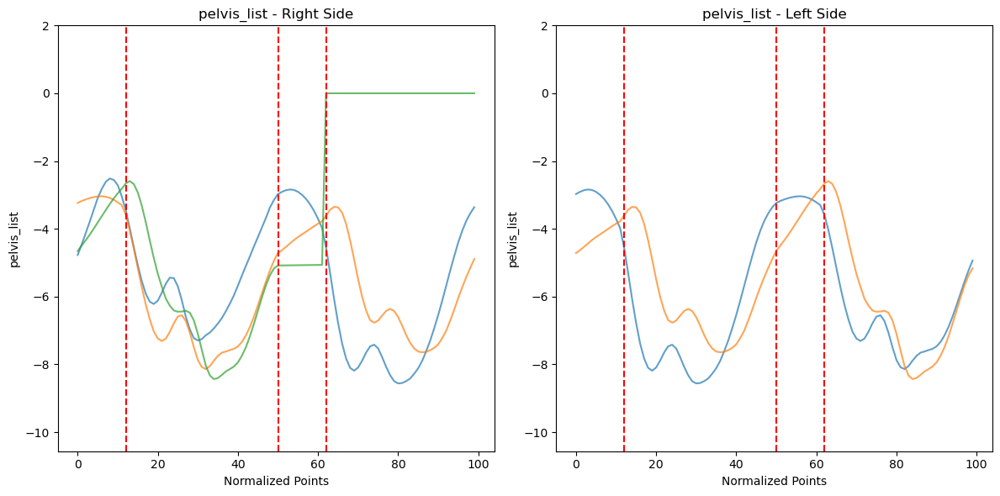

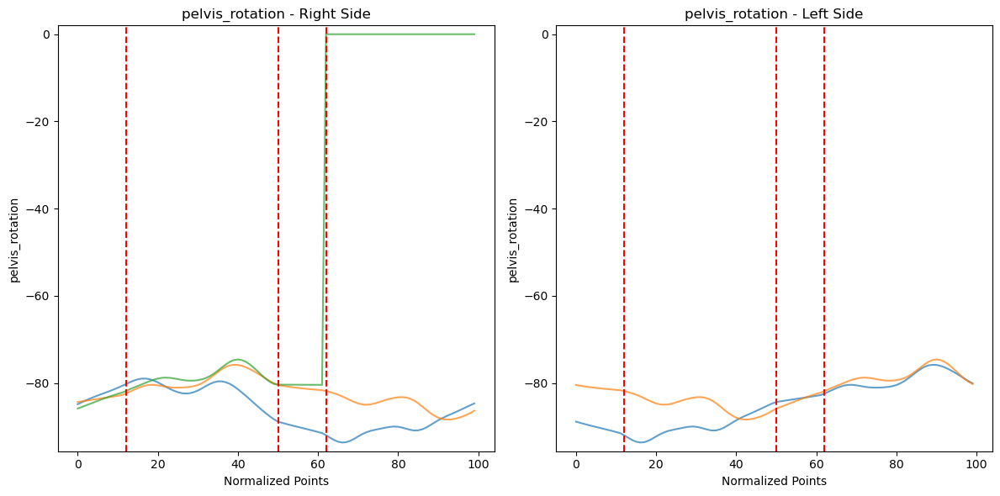

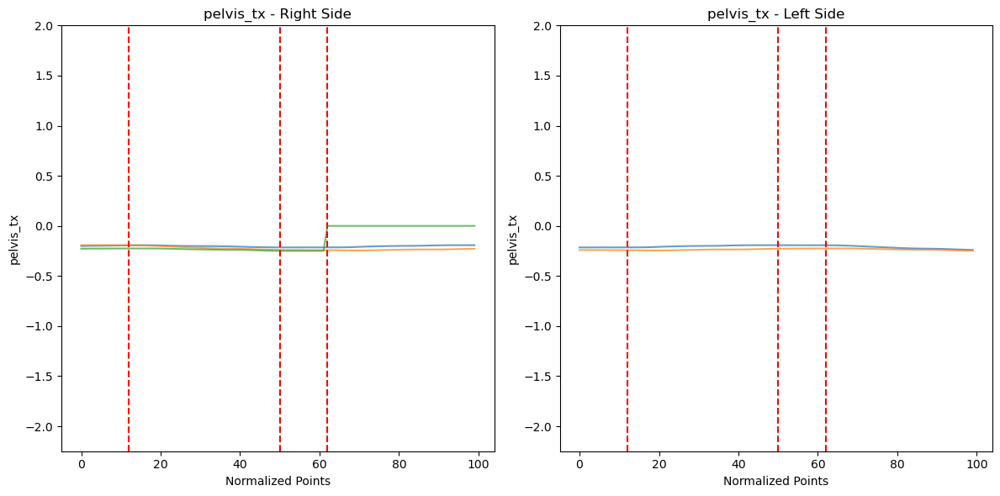

...

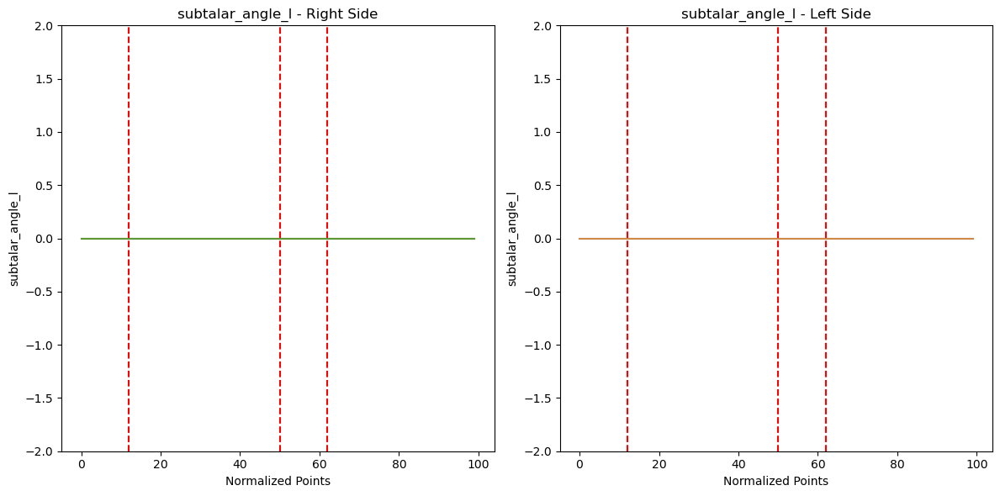

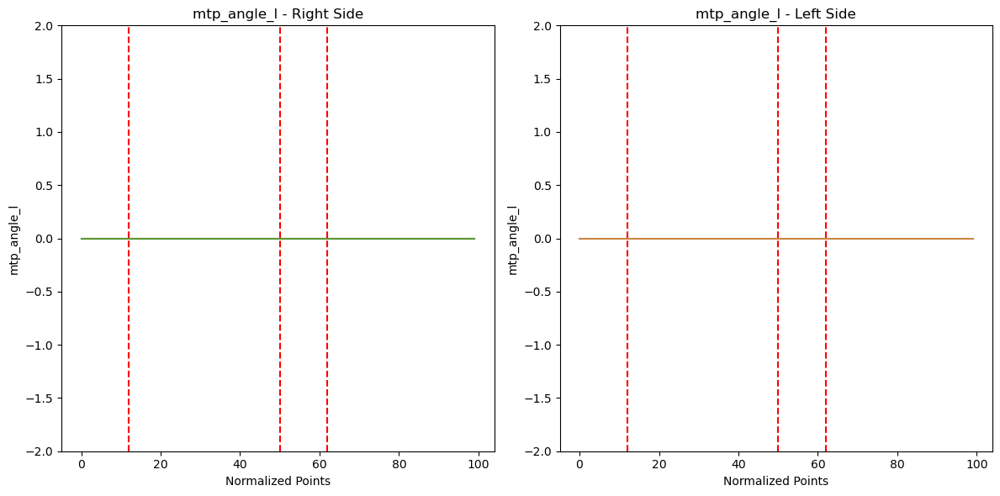

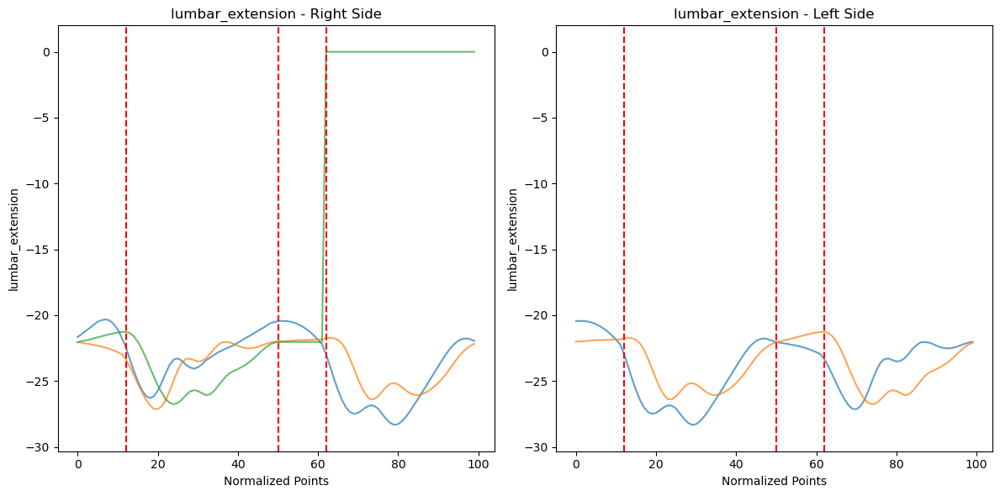

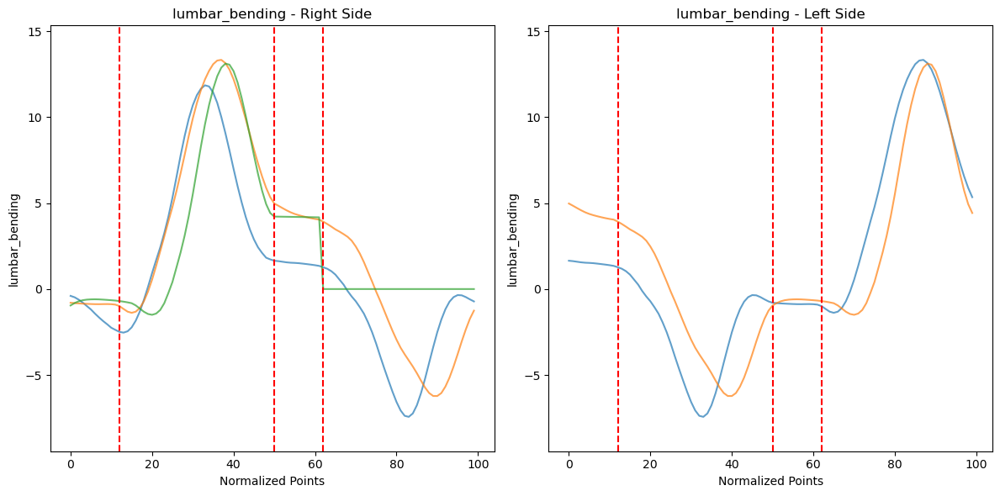

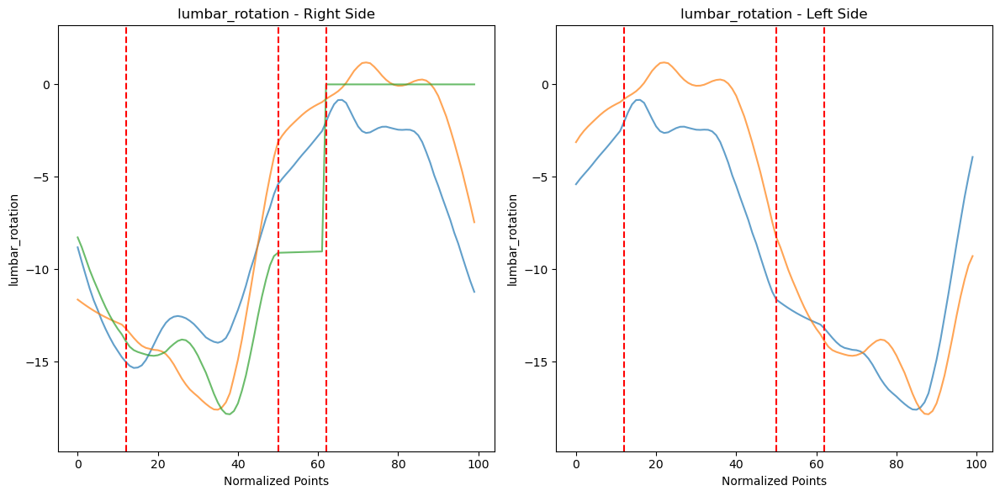

TypeError: Accessing a group is done with bytes or str, not <class 'slice'>

In [5]:
# Main script to process all trials
for trial in range(1, 22):
    current_folderpath = Path(folderpath) / f"{trial:02d}"
    current_HeelPath = HeelPathTemplate.format(f"{trial:02d}")
    mot_files = list((current_folderpath / 'IKResults').glob("*.mot"))
    json_save_path = os.path.join(base_json_path, f"Subject{trial:02d}.json")
    
    strideList_dict = {}
    
    for file_path in mot_files:
        file_path_str = str(file_path)
        data = pd.read_csv(file_path, sep='\t', header=header_line)
        current_headers = data.columns

        # Extract trial name from file path
        match = re.search(pattern, file_path_str)
        if match:
            trial_name = match.group(1)

            # Check if trial exists in the HDF5 file
            with h5py.File(current_HeelPath, 'r') as file:
                if trial_name in file['NexusData']:
                    heels_r = []
                    heels_l = []
                    toes_r = []
                    toes_l = []
                    
                    nexus_data_r = file['NexusData'][trial_name]['Right']['heels'][:]
                    nexus_data_l = file['NexusData'][trial_name]['Left']['heels'][:]
                    nexus_toes_r = file['NexusData'][trial_name]['Right']['Toes'][:]
                    nexus_toes_l = file['NexusData'][trial_name]['Left']['Toes'][:]

                    # Convert indices and store them
                    heels_r.extend([array.item() / 10 for array in nexus_data_r])
                    heels_l.extend([array.item() / 10 for array in nexus_data_l])
                    toes_r.extend([array.item() / 10 for array in nexus_toes_r])
                    toes_l.extend([array.item() / 10 for array in nexus_toes_l])

                    # Process strides for each header
                    for header in data.columns:
                        # Process strides for both sides and correct orientation
                        strides_r = process_side_strides(heels_r, header, data)
                        strides_l = process_side_strides(heels_l, header, data)

                        # Segment and normalize strides
                        phase_normalized_strides_r, phase_labels_r = segment_stride_phases(
                            heel_indices=heels_r, 
                            toe_indices=toes_r, 
                            contralateral_heel_indices=heels_l, 
                            contralateral_toe_indices=toes_l, 
                            header=header, 
                            data=data,
                            side='Right'
                        )
                        phase_normalized_strides_l, phase_labels_l = segment_stride_phases(
                            heel_indices=heels_l, 
                            toe_indices=toes_l, 
                            contralateral_heel_indices=heels_r, 
                            contralateral_toe_indices=toes_r, 
                            header=header, 
                            data=data,
                            side='Left'
                        )
                       
                        # Store the processed strides in the dictionary
                        strideList_dict[header] = {
                            'Right': phase_normalized_strides_r,
                            'Left': phase_normalized_strides_l
                        }

    # Plot the normalised strides for each header
    for header in strideList_dict:
        phase_normalized_strides_r = strideList_dict[header]['Right']
        phase_normalized_strides_l = strideList_dict[header]['Left']
        # Plot the strides for this header
        plot_normalized_strides(phase_normalized_strides_r, phase_normalized_strides_l, header, phase_labels_r, phase_labels_l)
